In [1]:
import torch
import torch.nn as nn
from torchvision import datasets
from torchvision import transforms
from torch.utils.data import DataLoader
from torchvision.datasets import ImageFolder

import numpy as np

import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

%matplotlib inline

In [2]:
#set training device to GPU if available
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

#batch size for training set
batch_size=128

#load dataset
mnist = datasets.MNIST('./MNIST_data', train=True, download=True,transform=transforms.ToTensor())

#Iterate dataset useing dataloader
loader_train = DataLoader(mnist, batch_size=batch_size, drop_last=True)

In [3]:
# Defining functions to use for training the data
import torch
import numpy as np

import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec


def show_images(images, color=False):
    if color:
        sqrtimg = int(np.ceil(np.sqrt(images.shape[2]*images.shape[3])))
    else:
        images = np.reshape(images, [images.shape[0], -1])  # images reshape to (batch_size, D)
        sqrtimg = int(np.ceil(np.sqrt(images.shape[1])))
    sqrtn = int(np.ceil(np.sqrt(images.shape[0])))


    fig = plt.figure(figsize=(sqrtn, sqrtn))
    gs = gridspec.GridSpec(sqrtn, sqrtn)
    gs.update(wspace=0.05, hspace=0.05)

    for i, img in enumerate(images):
        ax = plt.subplot(gs[i])
        plt.axis('off')
        ax.set_xticklabels([])
        ax.set_yticklabels([])
        ax.set_aspect('equal')
        if color:
            plt.imshow(np.swapaxes(np.swapaxes(img, 0, 1), 1, 2))
        else:
            plt.imshow(img.reshape([sqrtimg,sqrtimg]))
    return 

def preprocess_img(x):
    return 2 * x - 1.0

def deprocess_img(x):
    return (x + 1.0) / 2.0

def rel_error(x,y):
    return np.max(np.abs(x - y) / (np.maximum(1e-8, np.abs(x) + np.abs(y))))

def sample_noise(batch_size, dim):
    return torch.randn(batch_size, dim, 4, 4)

In [4]:
class Discriminator(nn.Module):
    def __init__(self, d_dim=4):
        super().__init__()
        self.conv1 = nn.Conv2d(1, d_dim, kernel_size=4, stride=2, padding=1, bias=False)
        
        self.conv2 = nn.Conv2d(d_dim, d_dim*2, kernel_size=4, stride=2, padding=1, bias=False)
        self.batch2 = nn.BatchNorm2d(d_dim*2)
        
        self.conv3 = nn.Conv2d(d_dim*2, d_dim*4, kernel_size=4, stride=2, padding=1, bias=False)
        self.batch3 = nn.BatchNorm2d(d_dim*4)
                
        self.linear = nn.Linear(144,1)
        
        self.d_dim = d_dim
        self.sigmoid = nn.Sigmoid()
        self.activation = nn.LeakyReLU(0.2, inplace=True)
        
    def forward(self, x):
        x = self.activation(self.conv1(x))
        x = self.activation(self.batch2(self.conv2(x)))
        x = self.activation(self.batch3(self.conv3(x)))
        x = x.view(128, -1)
        x = self.linear(x)
        return self.sigmoid(x)

In [5]:
class Generator(nn.Module):
    def __init__(self, noise_dim=100, g_dim=42):
        super().__init__()        
        self.ct1 = nn.ConvTranspose2d(noise_dim, g_dim*2, 3, stride=1, bias=False)
        self.batch1 = nn.BatchNorm2d(g_dim*2)
        
        self.ct2 = nn.ConvTranspose2d(g_dim*2, g_dim, 3, stride=2, bias=False)
        self.batch2 = nn.BatchNorm2d(g_dim)
        
        self.ct3 = nn.ConvTranspose2d(g_dim, 1, 4, stride=2, bias=False)
        
        self.activation = nn.ReLU(True)
        self.tanh = nn.Tanh()
        
    def forward(self, x):
        x = self.activation(self.batch1(self.ct1(x)))
        x = self.activation(self.batch2(self.ct2(x)))
        x = self.ct3(x)
        return self.tanh(x)
         

In [6]:
def training_loop(discriminator, generator, d_optimizer, g_optimizer, d_loss, g_loss, show_every=250, batch_size=128, noise_size=100,
                                                                n_epochs=50, train_loader=None, device=None):
    iter_count = 0
    
    for epoch in range(1, n_epochs+1):
        print("Epoch %d\n" % (epoch))
        for x, _ in train_loader:

            _, input_channels, img_size, _ = x.shape
            
            real_images = preprocess_img(x).to(device)

            d_error = None
            g_error = None
            fake_images = None

            # Updating Discriminator
            d_optimizer.zero_grad()
            logits_real = discriminator(real_images)
            real_label = torch.ones_like(logits_real, dtype=torch.float, device=device)*0.9
            errD_real = discriminator_loss(logits_real, real_label)
            
            fake_seed = sample_noise(batch_size, noise_size).to(device)
            fake_images = generator(fake_seed)
            logits_fake = discriminator(fake_images.detach())
            fake_label = torch.ones_like(logits_fake, dtype=torch.float, device=device)*0.1
            errD_fake = discriminator_loss(logits_fake, fake_label)
            
            d_error = errD_real + errD_fake
            d_error.backward()
            d_optimizer.step()

            # Updating Generator
            g_optimizer.zero_grad()
            fake_logits = discriminator(fake_images)
            real_label = torch.ones_like(fake_logits, dtype=torch.float, device=device)
            g_error = generator_loss(fake_logits, real_label)
            g_error.backward()
            g_optimizer.step()
            
            # Logging and output visualization
            if (iter_count % show_every == 0):
                print('Iter: {}, D: {:.4}, G:{:.4}'.format(iter_count,d_error.item(),g_error.item()))
                disp_fake_images = deprocess_img(fake_images.data)  # denormalize
                imgs_numpy = (disp_fake_images).cpu().numpy()
                show_images(imgs_numpy[0:16], color=input_channels!=1)
                plt.show()
                print()

            iter_count += 1

Epoch 1

Iter: 0, D: 1.498, G:0.4457


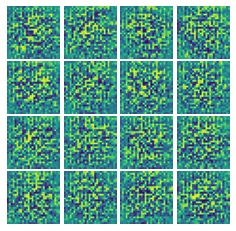


Iter: 250, D: 1.294, G:0.5948


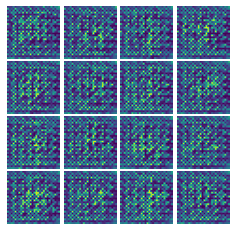


Epoch 2

Iter: 500, D: 1.33, G:0.6138


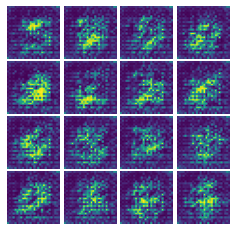


Iter: 750, D: 1.354, G:0.6215


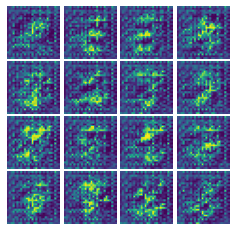


Epoch 3

Iter: 1000, D: 1.307, G:0.621


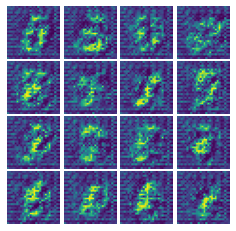


Iter: 1250, D: 1.267, G:0.632


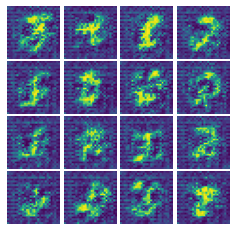


Epoch 4

Iter: 1500, D: 1.253, G:0.6331


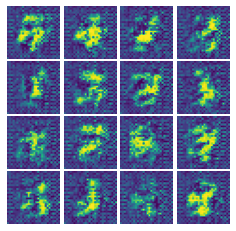


Iter: 1750, D: 1.228, G:0.6399


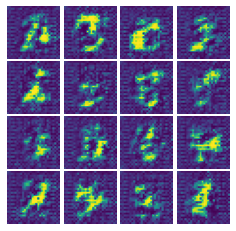


Epoch 5

Iter: 2000, D: 1.177, G:0.6599


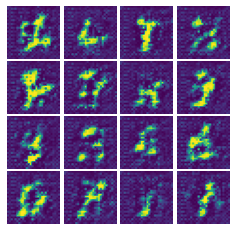


Iter: 2250, D: 1.167, G:0.6653


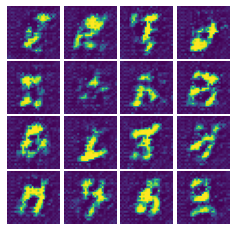


Epoch 6

Iter: 2500, D: 1.164, G:0.6659


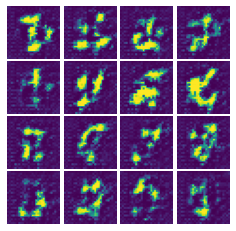


Iter: 2750, D: 1.129, G:0.6818


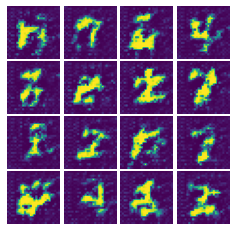


Epoch 7

Iter: 3000, D: 1.155, G:0.6722


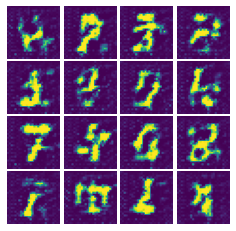


Iter: 3250, D: 1.137, G:0.6697


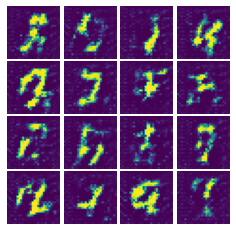


Epoch 8

Iter: 3500, D: 1.15, G:0.6801


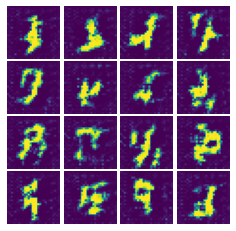


Epoch 9

Iter: 3750, D: 1.133, G:0.6808


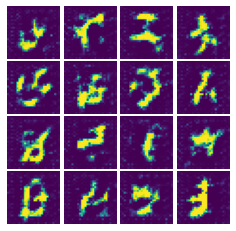


Iter: 4000, D: 1.134, G:0.6739


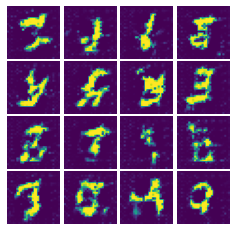


Epoch 10

Iter: 4250, D: 1.128, G:0.6791


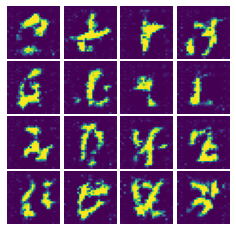


Iter: 4500, D: 1.124, G:0.6866


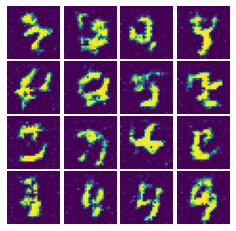


Epoch 11

Iter: 4750, D: 1.126, G:0.6851


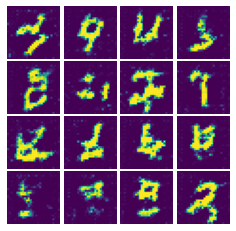


Iter: 5000, D: 1.143, G:0.6831


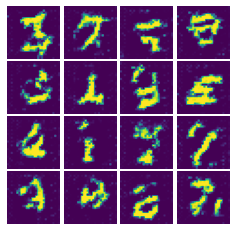


Epoch 12

Iter: 5250, D: 1.148, G:0.6772


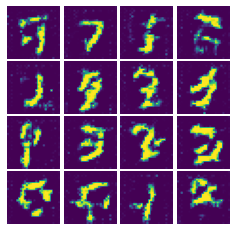


Iter: 5500, D: 1.127, G:0.6861


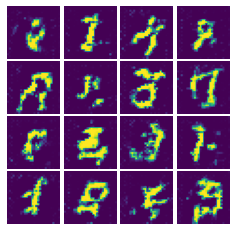


Epoch 13

Iter: 5750, D: 1.14, G:0.6878


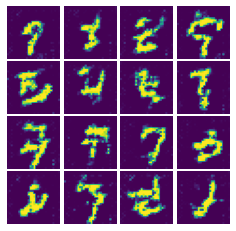


Iter: 6000, D: 1.14, G:0.686


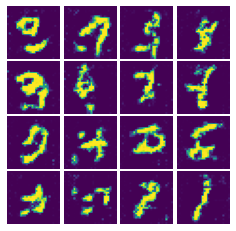


Epoch 14

Iter: 6250, D: 1.128, G:0.6849


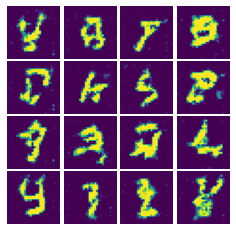


Iter: 6500, D: 1.119, G:0.6861


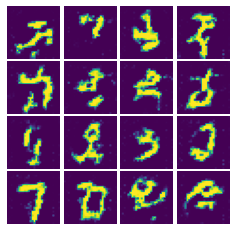


Epoch 15

Iter: 6750, D: 1.119, G:0.6857


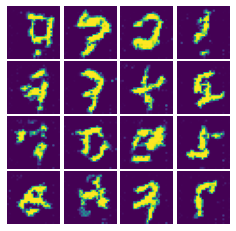


Iter: 7000, D: 1.119, G:0.692


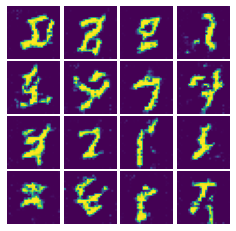


Epoch 16

Iter: 7250, D: 1.117, G:0.6904


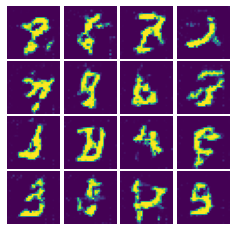


Epoch 17

Iter: 7500, D: 1.129, G:0.689


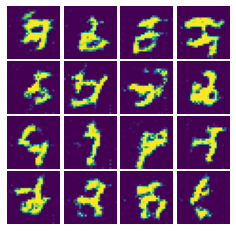


Iter: 7750, D: 1.122, G:0.6862


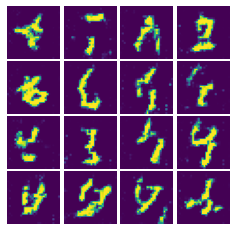


Epoch 18

Iter: 8000, D: 1.124, G:0.6851


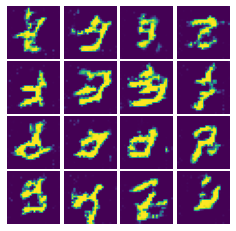


Iter: 8250, D: 1.121, G:0.6855


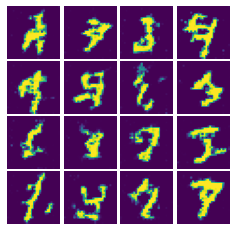


Epoch 19

Iter: 8500, D: 1.119, G:0.6855


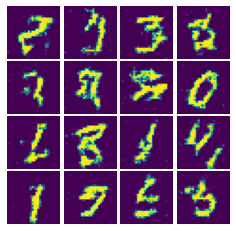


Iter: 8750, D: 1.128, G:0.6869


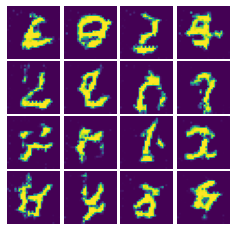


Epoch 20

Iter: 9000, D: 1.122, G:0.6818


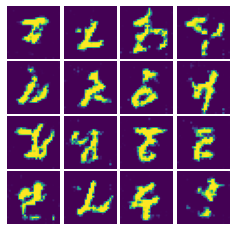


Iter: 9250, D: 1.131, G:0.6825


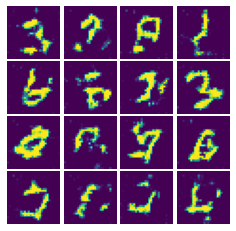


Epoch 21

Iter: 9500, D: 1.12, G:0.6892


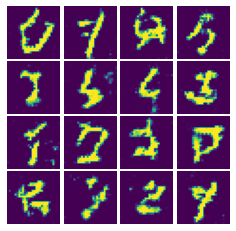


Iter: 9750, D: 1.136, G:0.674


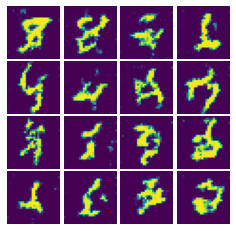


Epoch 22

Iter: 10000, D: 1.12, G:0.688


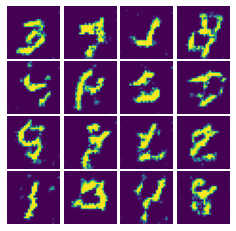


Iter: 10250, D: 1.121, G:0.6877


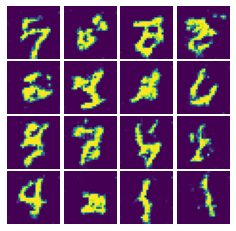


Epoch 23

Iter: 10500, D: 1.113, G:0.6887


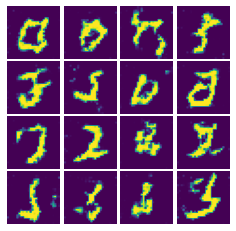


Iter: 10750, D: 1.111, G:0.6903


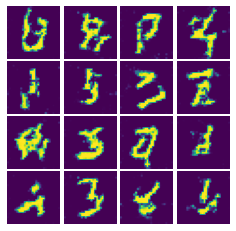


Epoch 24

Iter: 11000, D: 1.116, G:0.689


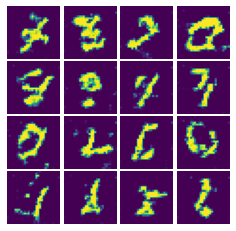


Epoch 25

Iter: 11250, D: 1.113, G:0.6897


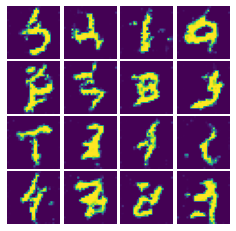


Iter: 11500, D: 1.121, G:0.6906


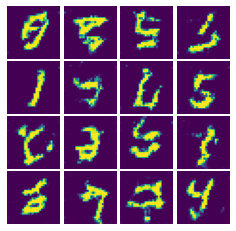


Epoch 26

Iter: 11750, D: 1.149, G:0.6861


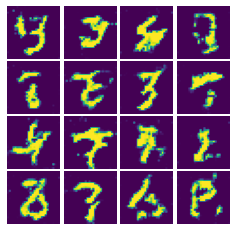


Iter: 12000, D: 1.117, G:0.6819


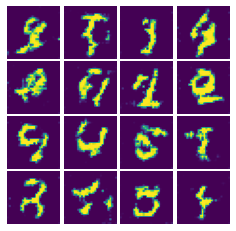


Epoch 27

Iter: 12250, D: 1.11, G:0.6912


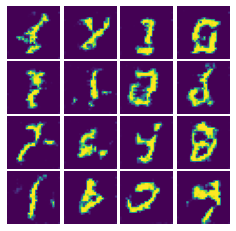


Iter: 12500, D: 1.12, G:0.6896


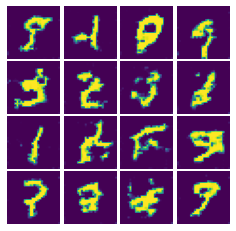


Epoch 28

Iter: 12750, D: 1.121, G:0.6827


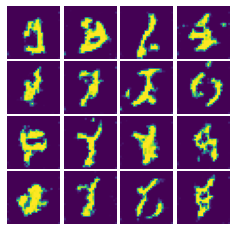


Iter: 13000, D: 1.113, G:0.6877


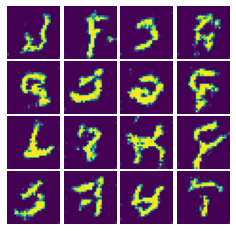


Epoch 29

Iter: 13250, D: 1.111, G:0.6902


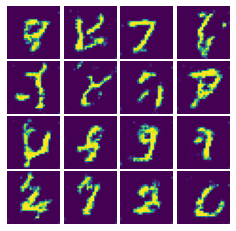


Iter: 13500, D: 1.128, G:0.6834


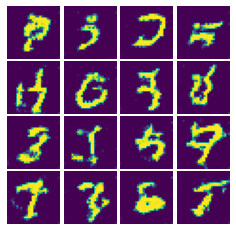


Epoch 30

Iter: 13750, D: 1.116, G:0.6898


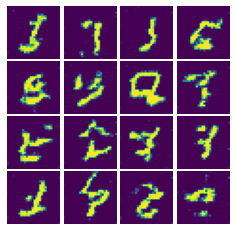


Iter: 14000, D: 1.117, G:0.6857


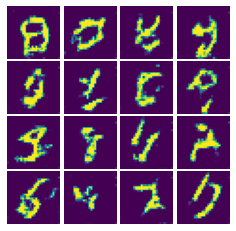


Epoch 31

Iter: 14250, D: 1.125, G:0.6875


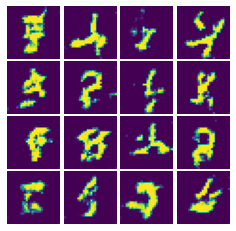


Iter: 14500, D: 1.112, G:0.6913


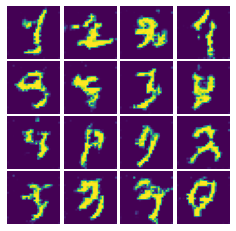


Epoch 32

Iter: 14750, D: 1.114, G:0.6897


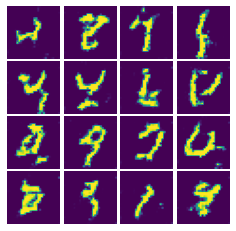


Epoch 33

Iter: 15000, D: 1.109, G:0.6919


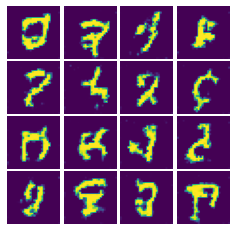


Iter: 15250, D: 1.112, G:0.69


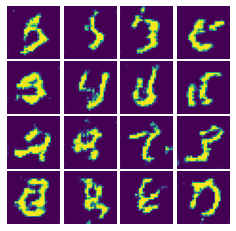


Epoch 34

Iter: 15500, D: 1.132, G:0.6772


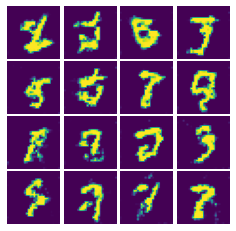


Iter: 15750, D: 1.11, G:0.691


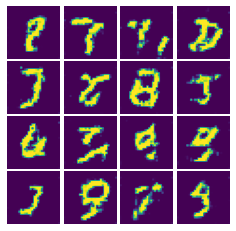


Epoch 35

Iter: 16000, D: 1.112, G:0.6918


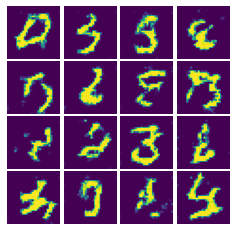


Iter: 16250, D: 1.109, G:0.6918


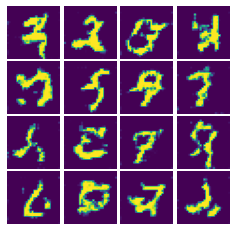


Epoch 36

Iter: 16500, D: 1.114, G:0.6898


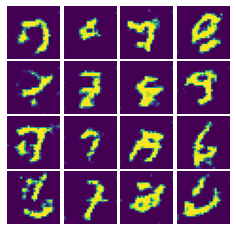


Iter: 16750, D: 1.113, G:0.6881


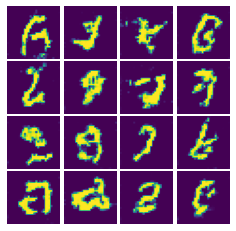


Epoch 37

Iter: 17000, D: 1.114, G:0.6902


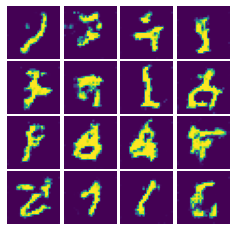


Iter: 17250, D: 1.108, G:0.6923


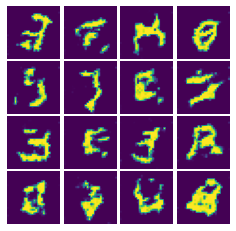


Epoch 38

Iter: 17500, D: 1.11, G:0.6911


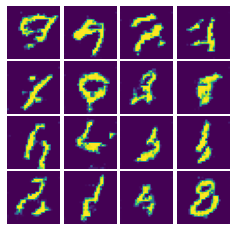


Iter: 17750, D: 1.115, G:0.6871


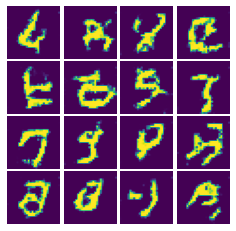


Epoch 39

Iter: 18000, D: 1.124, G:0.6872


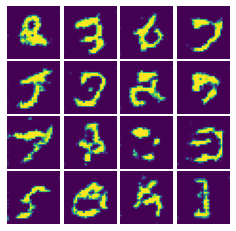


Iter: 18250, D: 1.111, G:0.6906


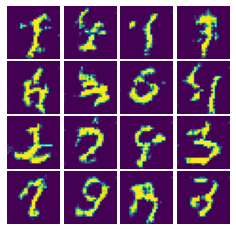


Epoch 40

Iter: 18500, D: 1.117, G:0.6868


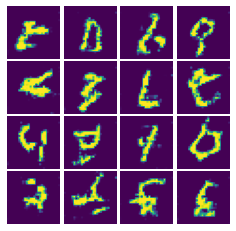


Epoch 41

Iter: 18750, D: 1.109, G:0.6914


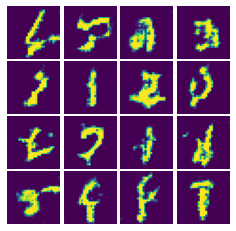


Iter: 19000, D: 1.115, G:0.6879


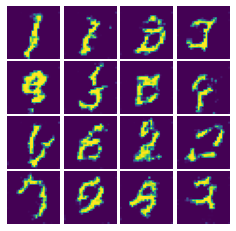


Epoch 42

Iter: 19250, D: 1.118, G:0.6888


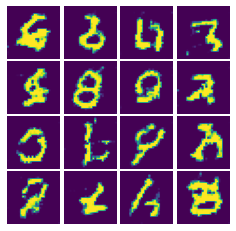


Iter: 19500, D: 1.111, G:0.6916


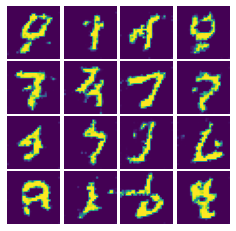


Epoch 43

Iter: 19750, D: 1.109, G:0.6918


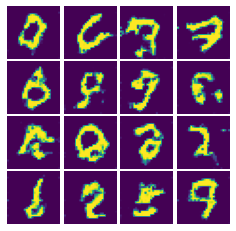


Iter: 20000, D: 1.115, G:0.6906


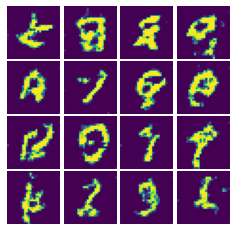


Epoch 44

Iter: 20250, D: 1.111, G:0.6909


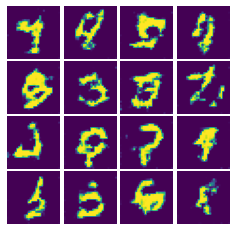


Iter: 20500, D: 1.118, G:0.6899


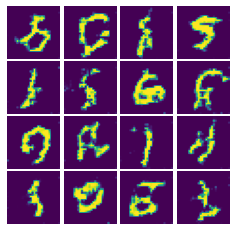


Epoch 45

Iter: 20750, D: 1.11, G:0.691


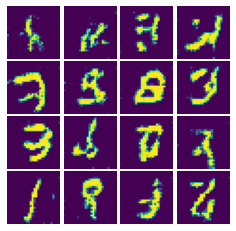


Iter: 21000, D: 1.108, G:0.692


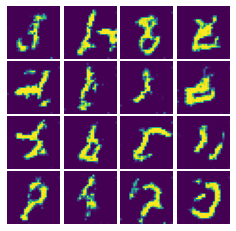


Epoch 46

Iter: 21250, D: 1.109, G:0.6911


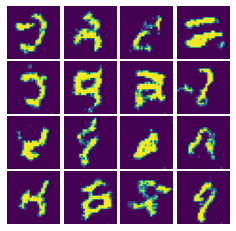


Iter: 21500, D: 1.117, G:0.6874


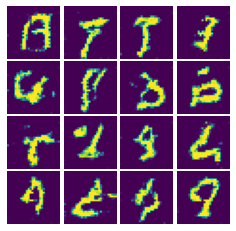


Epoch 47

Iter: 21750, D: 1.116, G:0.6871


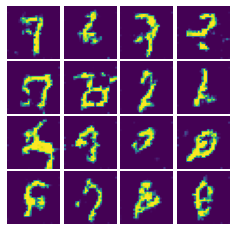


Epoch 48

Iter: 22000, D: 1.109, G:0.6923


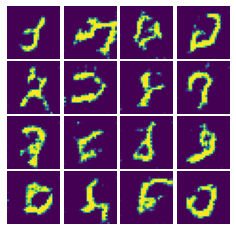


Iter: 22250, D: 1.111, G:0.6891


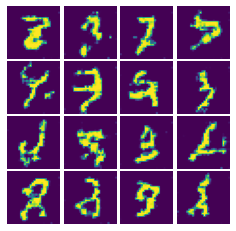


Epoch 49

Iter: 22500, D: 1.109, G:0.6922


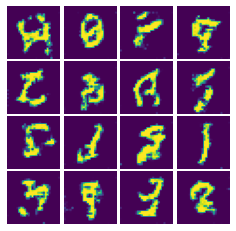


Iter: 22750, D: 1.109, G:0.6927


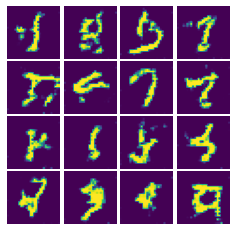


Epoch 50

Iter: 23000, D: 1.113, G:0.6908


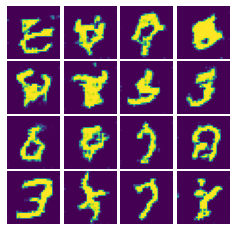


Iter: 23250, D: 1.113, G:0.6911


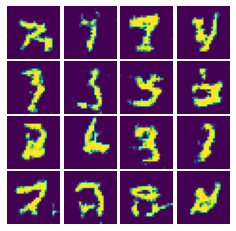


Epoch 51

Iter: 23500, D: 1.108, G:0.6923


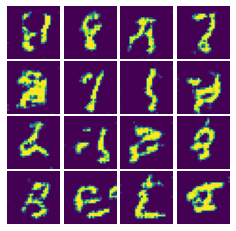


Iter: 23750, D: 1.115, G:0.6902


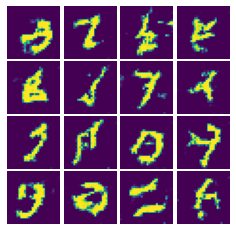


Epoch 52

Iter: 24000, D: 1.111, G:0.6901


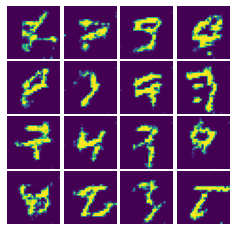


Iter: 24250, D: 1.117, G:0.6858


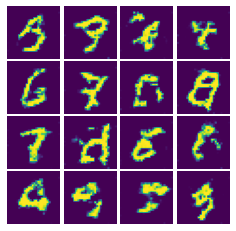


Epoch 53

Iter: 24500, D: 1.108, G:0.6922


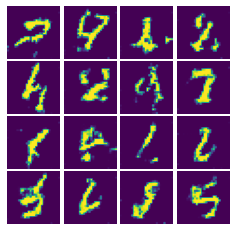


Iter: 24750, D: 1.11, G:0.6913


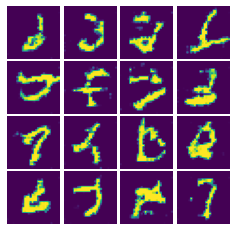


Epoch 54

Iter: 25000, D: 1.109, G:0.6917


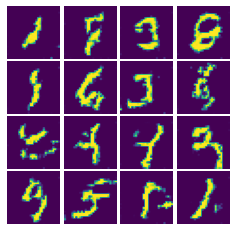


Iter: 25250, D: 1.108, G:0.6918


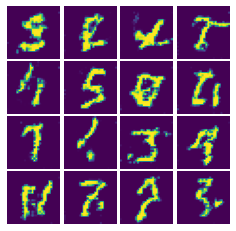


Epoch 55

Iter: 25500, D: 1.109, G:0.691


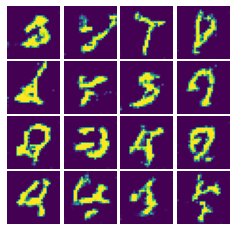


Epoch 56

Iter: 25750, D: 1.116, G:0.6888


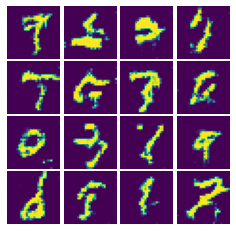


Iter: 26000, D: 1.109, G:0.6913


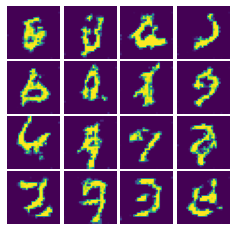


Epoch 57

Iter: 26250, D: 1.109, G:0.6924


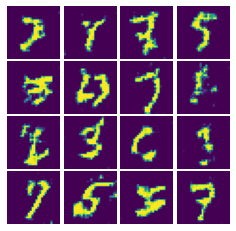


Iter: 26500, D: 1.115, G:0.6903


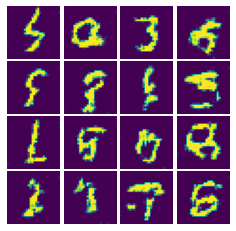


Epoch 58

Iter: 26750, D: 1.115, G:0.6889


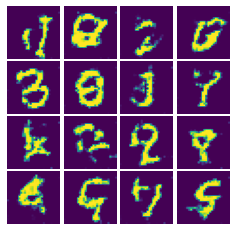


Iter: 27000, D: 1.112, G:0.6897


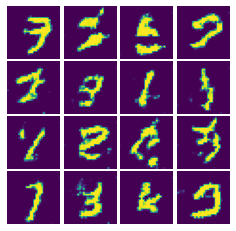


Epoch 59

Iter: 27250, D: 1.11, G:0.6926


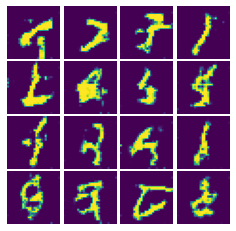


Iter: 27500, D: 1.111, G:0.6914


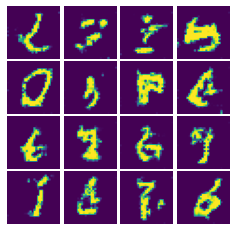


Epoch 60

Iter: 27750, D: 1.127, G:0.6913


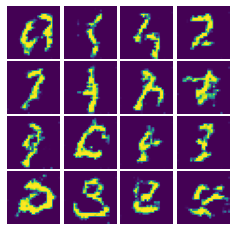


Iter: 28000, D: 1.113, G:0.6921


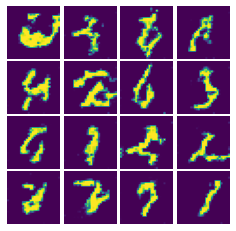


Epoch 61

Iter: 28250, D: 1.109, G:0.6921


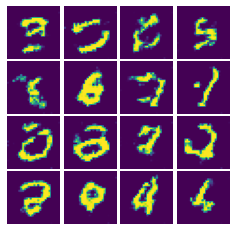


Iter: 28500, D: 1.107, G:0.693


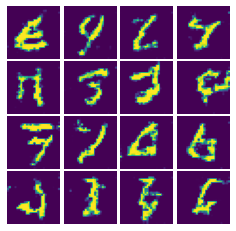


Epoch 62

Iter: 28750, D: 1.112, G:0.6911


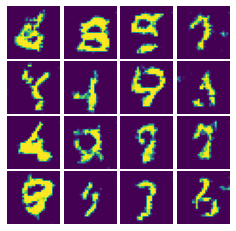


Iter: 29000, D: 1.109, G:0.6919


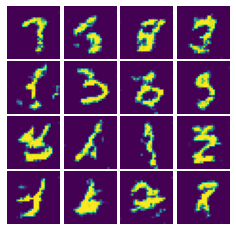


Epoch 63

Iter: 29250, D: 1.111, G:0.6924


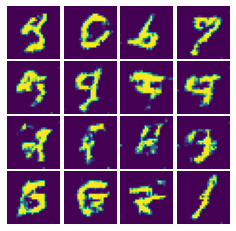


Epoch 64

Iter: 29500, D: 1.107, G:0.6931


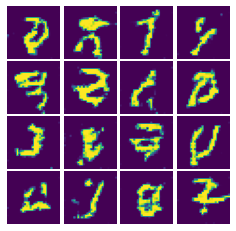


Iter: 29750, D: 1.108, G:0.6921


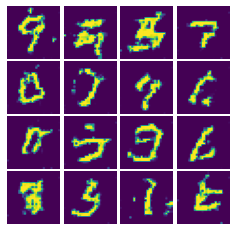


Epoch 65

Iter: 30000, D: 1.108, G:0.6926


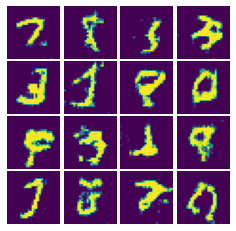


Iter: 30250, D: 1.107, G:0.6927


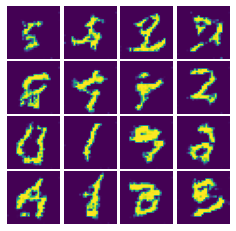


Epoch 66

Iter: 30500, D: 1.112, G:0.6919


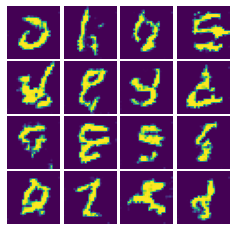


Iter: 30750, D: 1.109, G:0.692


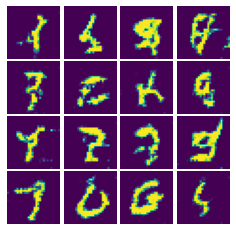


Epoch 67

Iter: 31000, D: 1.11, G:0.6925


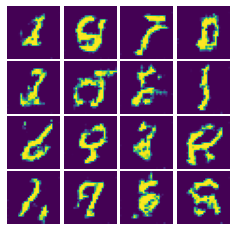


Iter: 31250, D: 1.109, G:0.6919


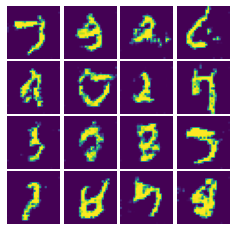


Epoch 68

Iter: 31500, D: 1.112, G:0.6901


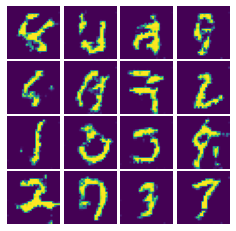


Iter: 31750, D: 1.108, G:0.6896


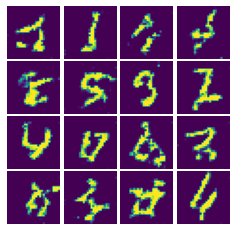


Epoch 69

Iter: 32000, D: 1.111, G:0.6913


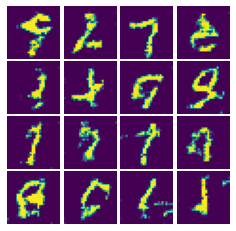


Iter: 32250, D: 1.107, G:0.6927


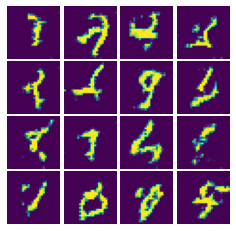


Epoch 70

Iter: 32500, D: 1.11, G:0.6921


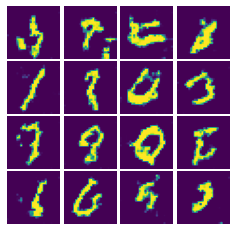


Iter: 32750, D: 1.107, G:0.6927


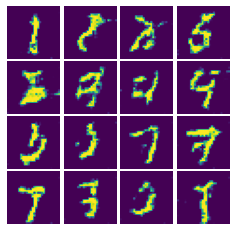


Epoch 71

Iter: 33000, D: 1.109, G:0.6921


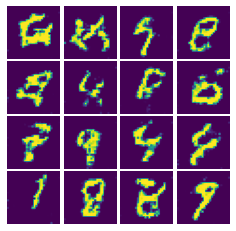


Epoch 72

Iter: 33250, D: 1.108, G:0.6921


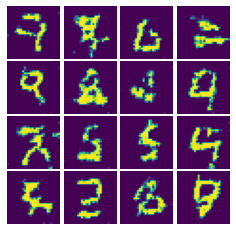


Iter: 33500, D: 1.108, G:0.6927


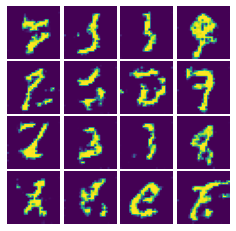


Epoch 73

Iter: 33750, D: 1.107, G:0.6916


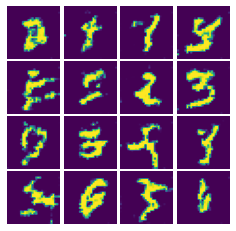


Iter: 34000, D: 1.107, G:0.6929


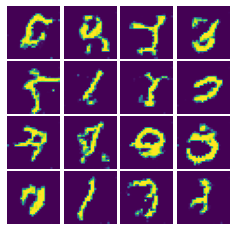


Epoch 74

Iter: 34250, D: 1.107, G:0.6929


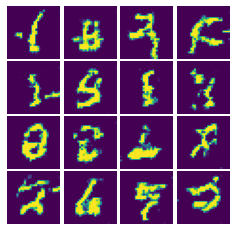


Iter: 34500, D: 1.108, G:0.6925


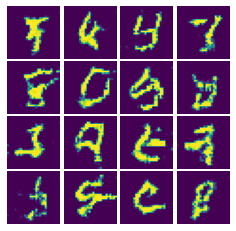


Epoch 75

Iter: 34750, D: 1.11, G:0.692


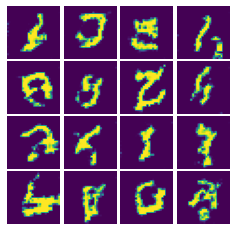


Iter: 35000, D: 1.108, G:0.6925


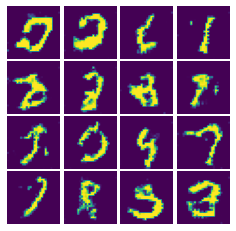


Epoch 76

Iter: 35250, D: 1.107, G:0.6921


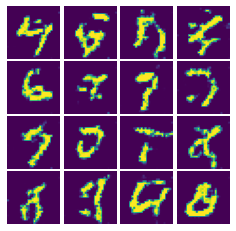


Iter: 35500, D: 1.107, G:0.6926


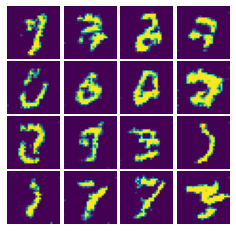


Epoch 77

Iter: 35750, D: 1.107, G:0.693


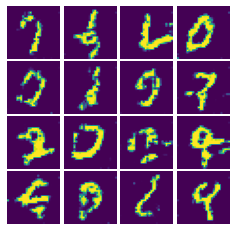


Iter: 36000, D: 1.107, G:0.6931


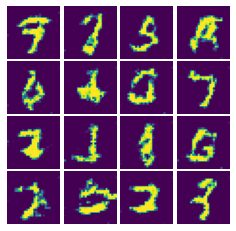


Epoch 78

Iter: 36250, D: 1.108, G:0.6919


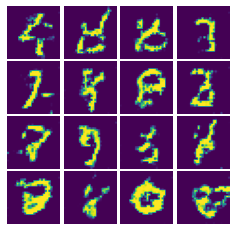


Iter: 36500, D: 1.107, G:0.6929


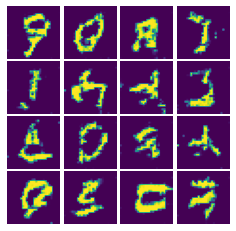


Epoch 79

Iter: 36750, D: 1.107, G:0.6927


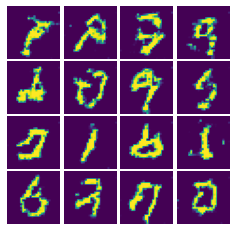


Epoch 80

Iter: 37000, D: 1.109, G:0.6924


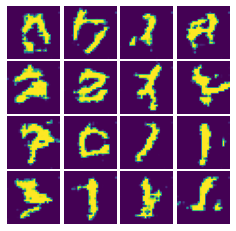


Iter: 37250, D: 1.107, G:0.6931


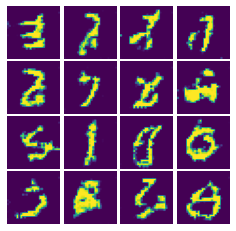


Epoch 81

Iter: 37500, D: 1.107, G:0.6927


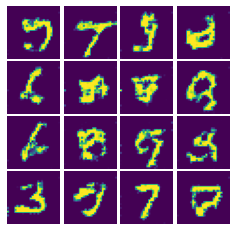


Iter: 37750, D: 1.108, G:0.6921


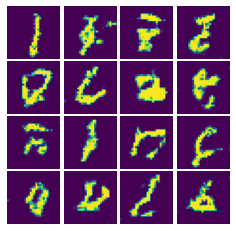


Epoch 82

Iter: 38000, D: 1.109, G:0.692


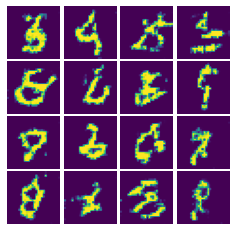


Iter: 38250, D: 1.109, G:0.6906


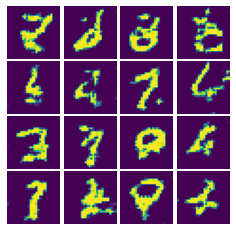


Epoch 83

Iter: 38500, D: 1.109, G:0.6919


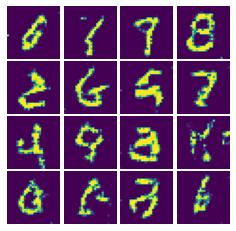


Iter: 38750, D: 1.108, G:0.6928


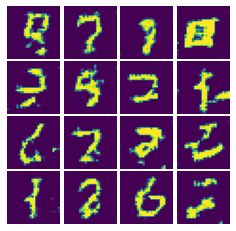


Epoch 84

Iter: 39000, D: 1.108, G:0.6926


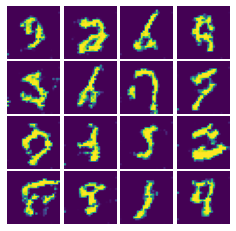


Iter: 39250, D: 1.107, G:0.693


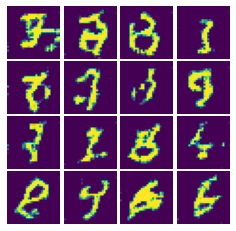


Epoch 85

Iter: 39500, D: 1.107, G:0.6926


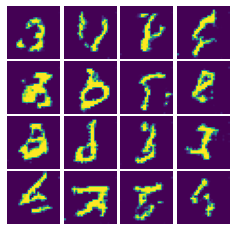


Iter: 39750, D: 1.107, G:0.6927


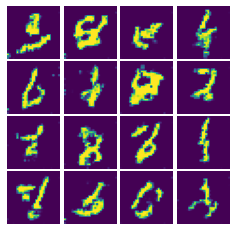


Epoch 86

Iter: 40000, D: 1.107, G:0.6928


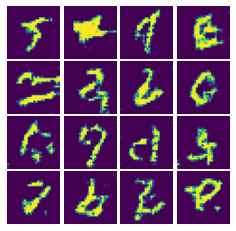


Epoch 87

Iter: 40250, D: 1.107, G:0.6929


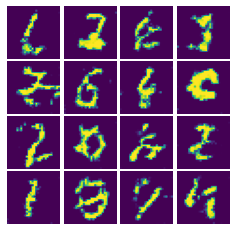


Iter: 40500, D: 1.108, G:0.6925


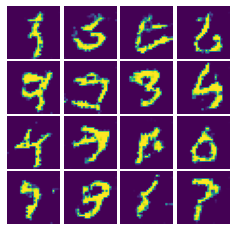


Epoch 88

Iter: 40750, D: 1.107, G:0.693


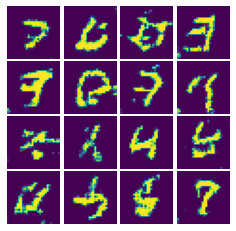


Iter: 41000, D: 1.107, G:0.693


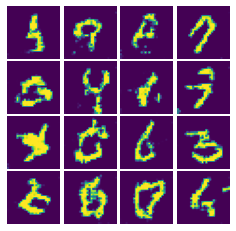


Epoch 89

Iter: 41250, D: 1.109, G:0.6929


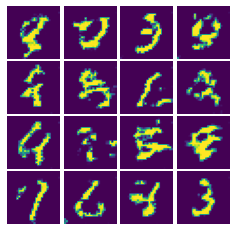


Iter: 41500, D: 1.109, G:0.6927


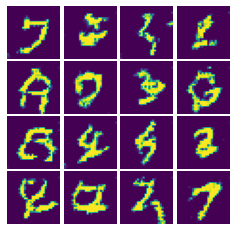


Epoch 90

Iter: 41750, D: 1.108, G:0.6923


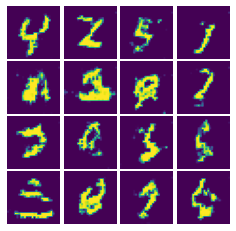


Iter: 42000, D: 1.107, G:0.6929


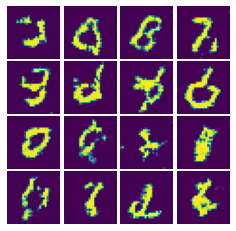


Epoch 91

Iter: 42250, D: 1.109, G:0.6921


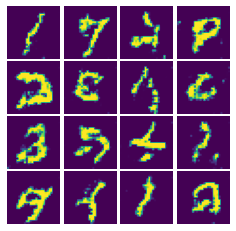


Iter: 42500, D: 1.107, G:0.693


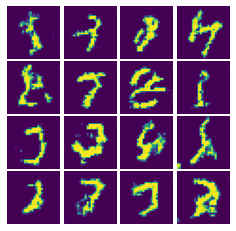


Epoch 92

Iter: 42750, D: 1.108, G:0.6923


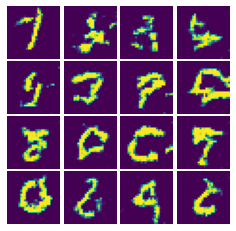


Iter: 43000, D: 1.111, G:0.6929


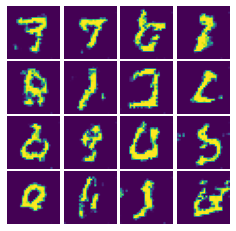


Epoch 93

Iter: 43250, D: 1.107, G:0.693


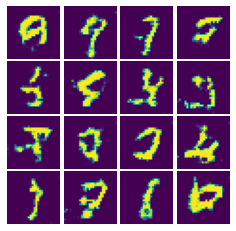


Iter: 43500, D: 1.107, G:0.693


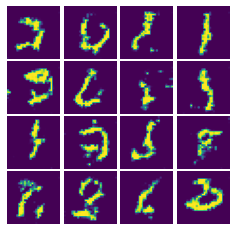


Epoch 94

Iter: 43750, D: 1.107, G:0.6927


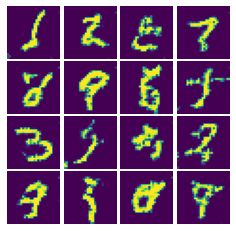


Epoch 95

Iter: 44000, D: 1.109, G:0.692


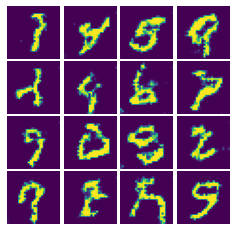


Iter: 44250, D: 1.107, G:0.6925


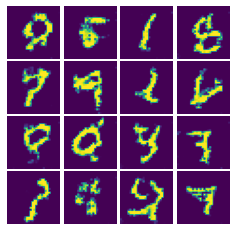


Epoch 96

Iter: 44500, D: 1.107, G:0.6929


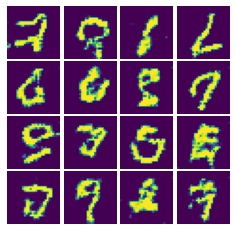


Iter: 44750, D: 1.107, G:0.693


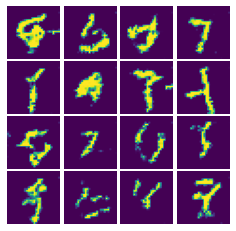


Epoch 97

Iter: 45000, D: 1.11, G:0.6919


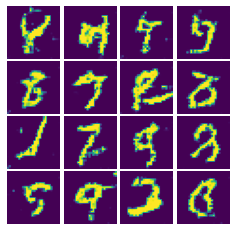


Iter: 45250, D: 1.107, G:0.693


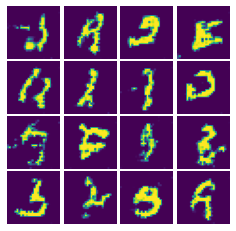


Epoch 98

Iter: 45500, D: 1.107, G:0.6927


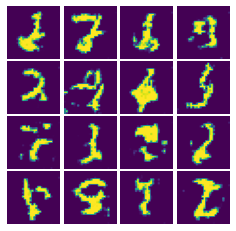


Iter: 45750, D: 1.107, G:0.6927


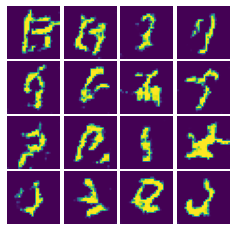


Epoch 99

Iter: 46000, D: 1.107, G:0.6925


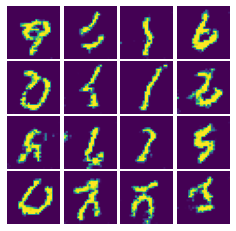


Iter: 46250, D: 1.111, G:0.6926


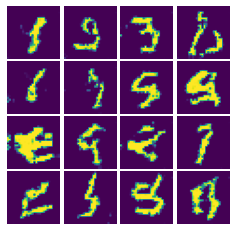


Epoch 100

Iter: 46500, D: 1.107, G:0.693


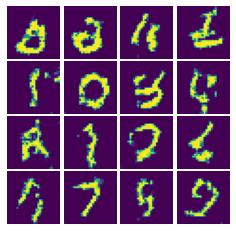


Iter: 46750, D: 1.108, G:0.6929


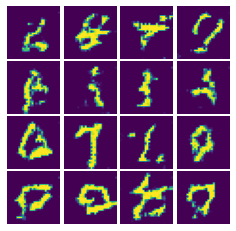

In [7]:
discriminator = Discriminator().to(device)
generator = Generator().to(device)

d_optimizer = torch.optim.Adam(discriminator.parameters(), lr=0.0003, betas = (0.5, 0.999))
g_optimizer = torch.optim.Adam(generator.parameters(), lr=0.0003, betas = (0.5, 0.999))

discriminator_loss = nn.BCEWithLogitsLoss()
generator_loss = nn.BCEWithLogitsLoss()

training_loop(discriminator, generator, d_optimizer, g_optimizer, discriminator_loss, generator_loss, train_loader=loader_train, n_epochs=100, device=device)